<div align="center">

  <a href="https://ultralytics.com/yolov8" target="_blank">
    <img width="1024", src="https://raw.githubusercontent.com/ultralytics/assets/main/yolov8/banner-yolov8.png"></a>

  [中文](https://docs.ultralytics.com/zh/) | [한국어](https://docs.ultralytics.com/ko/) | [日本語](https://docs.ultralytics.com/ja/) | [Русский](https://docs.ultralytics.com/ru/) | [Deutsch](https://docs.ultralytics.com/de/) | [Français](https://docs.ultralytics.com/fr/) | [Español](https://docs.ultralytics.com/es/) | [Português](https://docs.ultralytics.com/pt/) | [हिन्दी](https://docs.ultralytics.com/hi/) | [العربية](https://docs.ultralytics.com/ar/)

  <a href="https://console.paperspace.com/github/ultralytics/ultralytics"><img src="https://assets.paperspace.io/img/gradient-badge.svg" alt="Run on Gradient"/></a>
  <a href="https://colab.research.google.com/github/ultralytics/ultralytics/blob/main/examples/tutorial.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"></a>
  <a href="https://www.kaggle.com/ultralytics/yolov8"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" alt="Open In Kaggle"></a>

Welcome to the Ultralytics Explorer API notebook!  This notebook serves as the starting point for exploring the various resources available to help you get started with using Ultralytics to explore your datasets using with the power of semantic search. You can utilities out of the box that allow you to examine specific types of labels using vector search or even SQL queries.

We hope that the resources in this notebook will help you get the most out of Ultralytics. Please browse the Explorer <a href="https://docs.ultralytics.com/">Docs</a> for details, raise an issue on <a href="https://github.com/ultralytics/ultralytics">GitHub</a> for support, and join our <a href="https://ultralytics.com/discord">Discord</a> community for questions and discussions!

Try `yolo explorer` 

</div>

## Setup
Pip install `ultralytics` and [dependencies](https://github.com/ultralytics/ultralytics/blob/main/pyproject.toml) and check software and hardware.

In [ ]:
%pip install ultralytics
from ultralytics import Explorer
ultralytics.checks()

# 1. Similarity search
Utilize the power of vector similarity search to find the similar data points in your dataset along with their distance in the embedding space. Simply create an embeddings table for the given dataset-model pair. It is only needed once and it is reused automatically.


In [2]:
exp = Explorer("VOC.yaml", model="yolov8n.pt")
exp.create_embeddings_table()

Table voc.yaml_yolov8n.pt already exists. Reusing it. Pass force=True to overwrite it.


One the embeddings table is built, you can get run semantic search in any of the following ways:
- On a given index / list of indices in the dataset like - `exp.get_similar(idx=[1,10], limit=10)`
- On any image/ list of images not in the dataset  - `exp.get_similar(img=["path/to/img1", "path/to/img2"], limit=10)`
In case of multiple inputs, the aggregade of their embeddings is used.

You get a pandas dataframe with the `limit` number of most similar data points to the input, along with their distance in the embedding space. You can use this dataset to perform further filtering

In [3]:
similar = exp.get_similar(idx=1, limit=10)
similar.head()

,im_file,labels,cls,bboxes,masks,keypoints,vector,_distance
0,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[horse, person]","[12, 14]","[[89.0, 77.0, 402.0, 335.0], [184.0, 60.999996...",[[[]]],[[[]]],"[-0.03899837, -0.06302025, -0.14101748, -0.174...",0.000000
1,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[horse, person]","[12, 14]","[[77.0, 83.99999237060547, 411.0, 312.0], [160...",[[[]]],[[[]]],"[-0.0058841333, -0.057464976, -0.14296818, -0....",0.123255
2,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[horse, person]","[12, 14]","[[102.99998474121094, 72.99999237060547, 419.0...",[[[]]],[[[]]],"[-0.0289488, -0.07720768, -0.19553086, -0.1674...",0.129963
3,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[horse, person]","[12, 14]","[[86.0, 63.99999237060547, 397.0, 337.0], [179...",[[[]]],[[[]]],"[-0.028771615, -0.10757309, -0.1711195, -0.166...",0.374282
4,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[horse, horse, person, person]","[12, 12, 14, 14]","[[74.0, 77.0, 404.0, 329.0], [381.0, 128.0, 47...",[[[]]],[[[]]],"[-0.06387301, -0.08490437, -0.1007359, -0.1919...",0.406159


You can use the also plot the similar samples directly using the `plot_similar` util

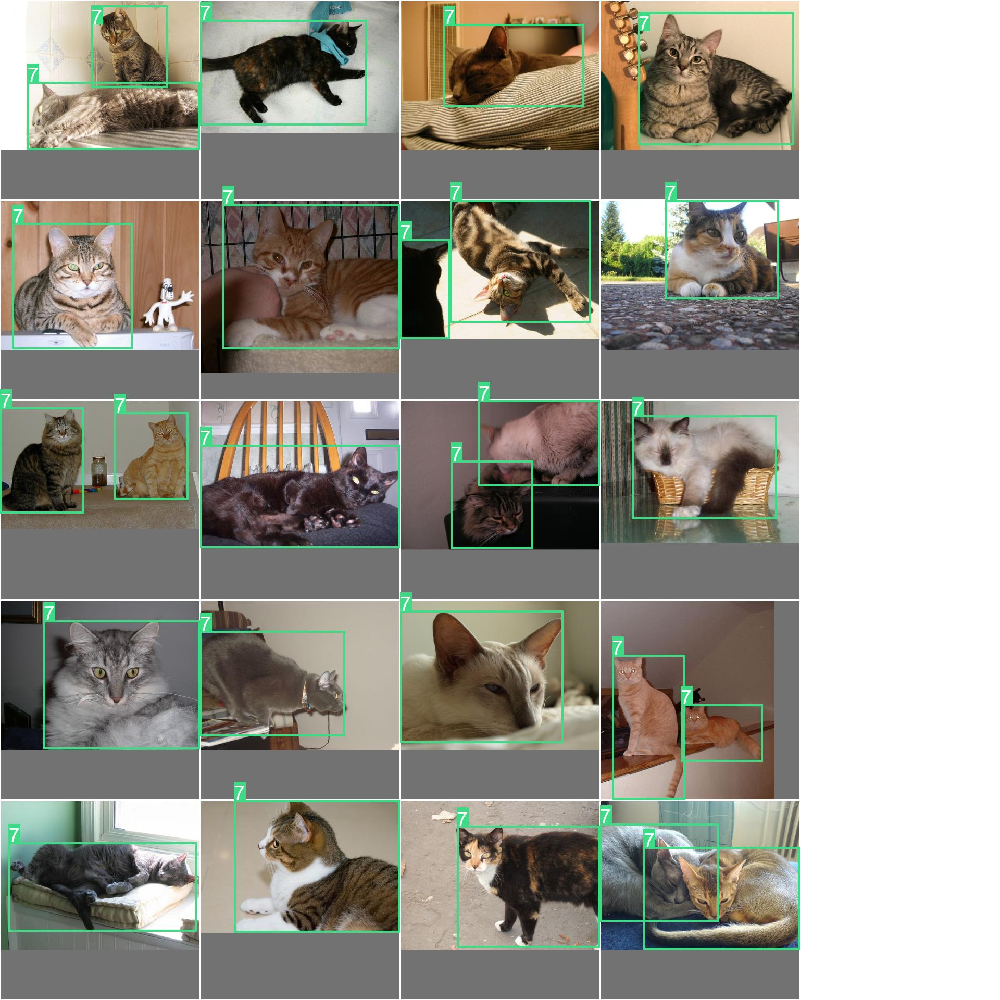

In [5]:
exp.plot_similar(idx=6500, limit=20)
#exp.plot_similar(idx=[100,101], limit=10) # Can also pass list of idxs or imgs


Corrupt JPEG data: premature end of data segment


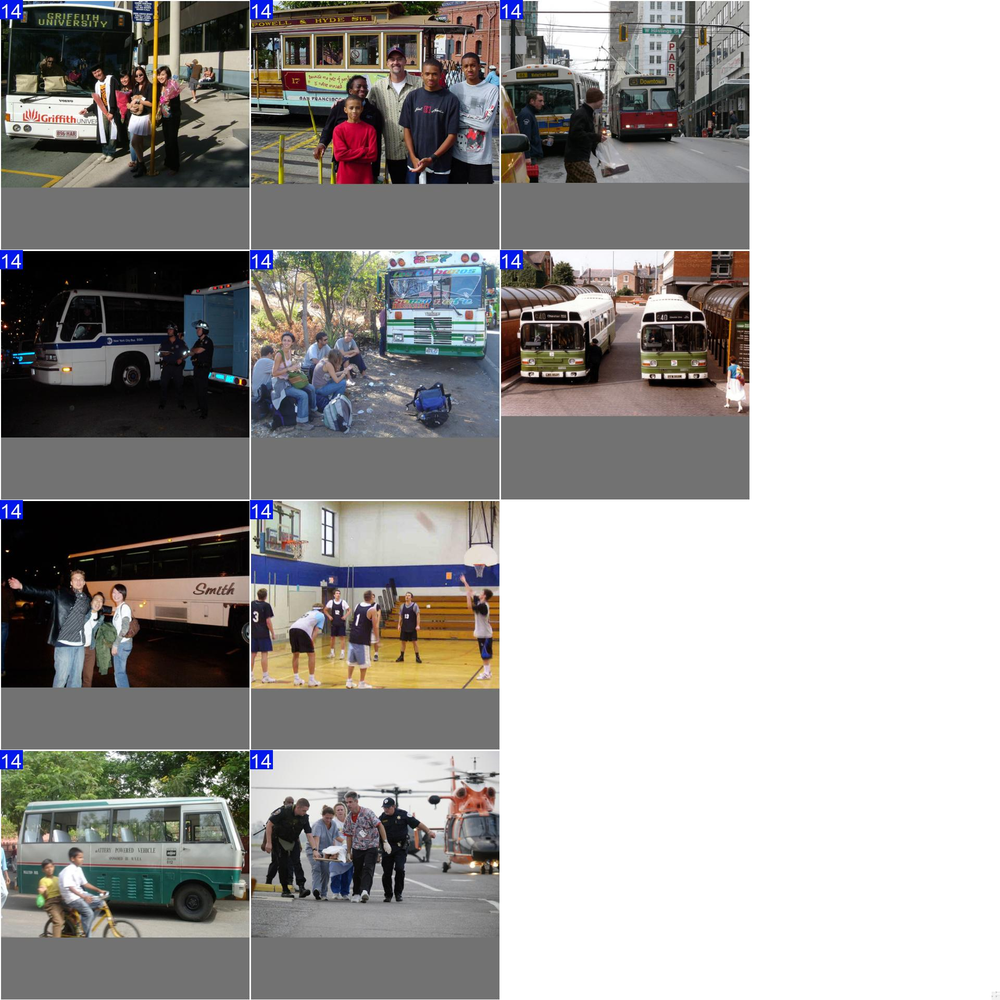

In [19]:
exp.plot_similar(img="https://ultralytics.com/images/bus.jpg", limit=10, labels=False) # Can also pass any external images


## 2. Run SQL queries on your Dataset!
Sometimes you might want to investigate a certain type of entries in your dataset. For this Explorer allows you to execute SQL queries.
It accepts either of the formats:
- Queries beginning with "WHERE" will automatically select all columns. This can be thought of as a short-hand query
- You can also write full queries where you can specify which columns to select

This can be used to investigate model performance and specific data points. For example:
- let's say your model struggles on images that have humans and dogs. You can write a query like this to select the points that have at least 2 humans AND atleast one dog.

You can combine SQL query and semantic search to filter down to specific type of results

In [20]:
table = exp.sql_query("WHERE labels LIKE '%person, person%' AND labels LIKE '%dog%' LIMIT 10")
table

Running query: SELECT * FROM 'table' WHERE labels LIKE '%person, person%' AND labels LIKE '%dog%' LIMIT 10


,im_file,labels,cls,bboxes,masks,keypoints,vector
0,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, person, person, person, person, person, ...","[11, 14, 14, 14, 14, 14, 16, 16]","[[294.0, 177.0, 381.0, 242.0], [410.0, 50.0, 4...",[[[]]],[[[]]],"[-0.11654171347618103, -0.07051707804203033, -..."
1,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, person, person]","[11, 14, 14]","[[92.0, 108.0, 315.0, 324.0], [262.0, 2.000001...",[[[]]],[[[]]],"[-0.09060680866241455, -0.09423024952411652, -..."
2,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, person, person, tvmonitor]","[11, 14, 14, 19]","[[0.0, 424.0, 61.0, 474.0], [69.0, 13.00001144...",[[[]]],[[[]]],"[-0.0624120868742466, -0.20854628086090088, -0..."
3,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, person, person]","[11, 14, 14]","[[184.0, 157.0, 214.99998474121094, 229.000015...",[[[]]],[[[]]],"[-0.19278964400291443, -0.08489859849214554, -..."
4,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, person, person, person]","[11, 14, 14, 14]","[[1.0000020265579224, 152.0, 196.0, 374.0], [1...",[[[]]],[[[]]],"[-0.01023371983319521, -0.20455719530582428, -..."
5,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, dog, person, person, tvmonitor]","[11, 11, 14, 14, 19]","[[78.0, 280.0, 201.0, 450.0000305175781], [105...",[[[]]],[[[]]],"[0.00732467882335186, -0.17565663158893585, -0..."
6,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, dog, dog, person, person, person]","[11, 11, 11, 14, 14, 14]","[[210.0, 24.999998092651367, 332.0, 182.000015...",[[[]]],[[[]]],"[-0.09471112489700317, -0.15397121012210846, 0..."
7,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, dog, person, person]","[11, 11, 14, 14]","[[28.0, 95.99999237060547, 99.00000762939453, ...",[[[]]],[[[]]],"[-0.15227478742599487, -0.19163472950458527, -..."
8,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, person, person]","[11, 14, 14]","[[112.99999237060547, 34.9999885559082, 458.0,...",[[[]]],[[[]]],"[-0.011768407188355923, -0.19428007304668427, ..."
9,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[dog, person, person, sofa]","[11, 14, 14, 17]","[[213.99998474121094, 107.99999237060547, 385....",[[[]]],[[[]]],"[0.045840829610824585, -0.1812756359577179, -0..."


Just like similarity search, you also get a util to directly plot the sql queries using `exp.plot_sql_query`

Running query: SELECT * FROM 'table' WHERE labels LIKE '%person, person%' AND labels LIKE '%dog%' LIMIT 10


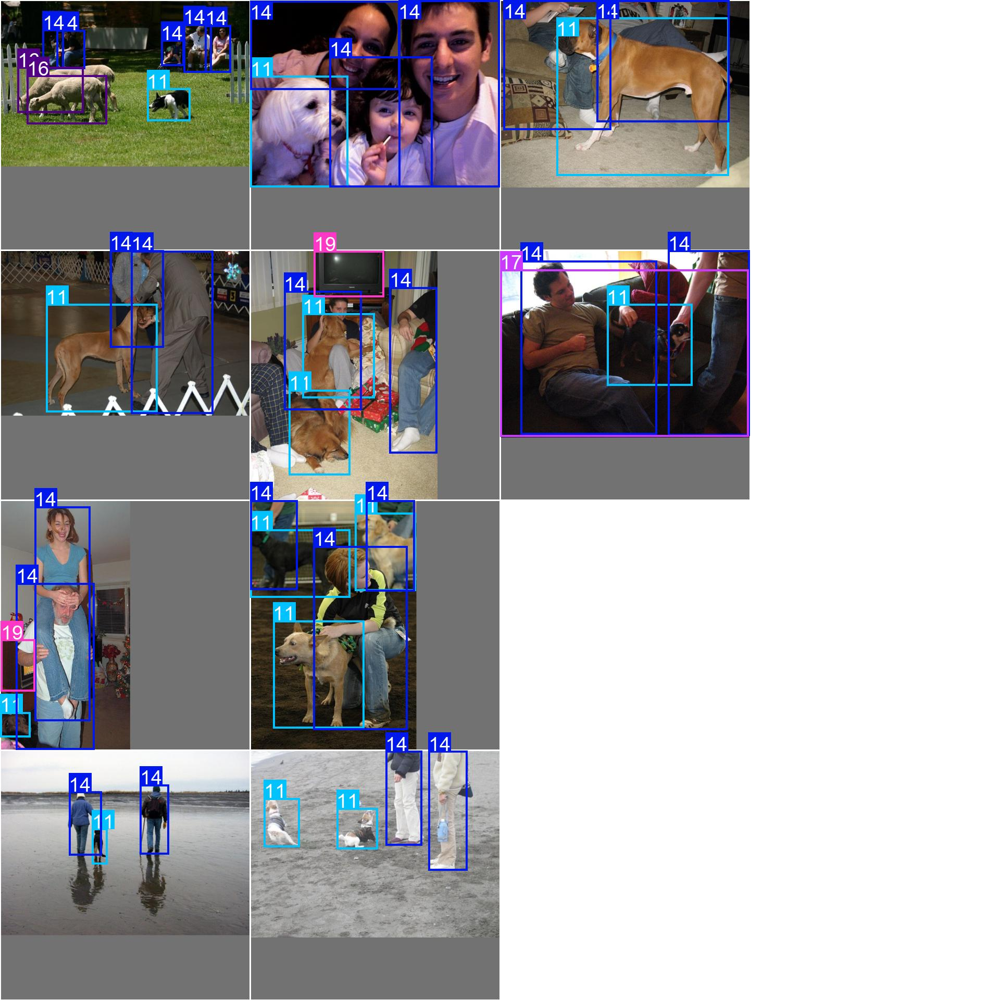

In [21]:
exp.plot_sql_query("WHERE labels LIKE '%person, person%' AND labels LIKE '%dog%' LIMIT 10", labels=True)

## 3. Working with embeddings Table (Advanced)
Explorer works on [LanceDB](https://lancedb.github.io/lancedb/) tables internally. You can access this table directly, using `Explorer.table` object and run raw queries, push down pre and post filters, etc.

In [23]:
table = exp.table
table.schema

im_file: string not null
labels: list<item: string> not null
  child 0, item: string
cls: list<item: int64> not null
  child 0, item: int64
bboxes: list<item: list<item: double>> not null
  child 0, item: list<item: double>
      child 0, item: double
masks: list<item: list<item: list<item: int64>>> not null
  child 0, item: list<item: list<item: int64>>
      child 0, item: list<item: int64>
          child 0, item: int64
keypoints: list<item: list<item: list<item: double>>> not null
  child 0, item: list<item: list<item: double>>
      child 0, item: list<item: double>
          child 0, item: double
vector: fixed_size_list<item: float>[256] not null
  child 0, item: float

### Run raw queries
Vector Search finds the nearest vectors from the database. In a recommendation system or search engine, you can find similar products from the one you searched. In LLM and other AI applications, each data point can be presented by the embeddings generated from some models, it returns the most relevant features.

A search in high-dimensional vector space, is to find K-Nearest-Neighbors (KNN) of the query vector.

Metric
In LanceDB, a Metric is the way to describe the distance between a pair of vectors. Currently, it supports the following metrics:
- L2
- Cosine
- Dot
Explorer's similarity search uses L2 by default. You can run queries on tables directly, or use the lance format to build custom utilities to manage datasets. More details on available LanceDB table ops in the [docs](https://lancedb.github.io/lancedb/)

In [27]:
dummy_img_embedding = [i for i in range(256)] 
table.search(dummy_img_embedding).limit(5).to_pandas()

,im_file,labels,cls,bboxes,masks,keypoints,vector,_distance
0,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[bottle, bottle, bottle, bottle, bottle, bottl...","[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, ...","[[150.0, 23.999998092651367, 180.0, 123.0], [1...",[[[]]],[[[]]],"[0.0730218, 0.059442926, 0.10715911, -0.153981...",5558741.0
1,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[bottle, bottle, bottle, bottle, bottle, bottl...","[4, 4, 4, 4, 4, 4, 4, 4]","[[0.0, 120.0, 104.0, 371.0], [63.0, 100.000007...",[[[]]],[[[]]],"[0.116367646, 0.048590478, 0.18641563, -0.1864...",5559199.5
2,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[bottle, bottle, bottle, bottle, bottle, bottl...","[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]","[[85.0, 454.0, 129.0, 499.0], [145.0, 462.0, 1...",[[[]]],[[[]]],"[0.0855938, -0.08594383, -0.07256419, -0.12484...",5559797.5
3,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[bottle, bottle, bottle, bottle, bottle, bottl...","[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]","[[94.00000762939453, 107.0, 256.0, 316.0], [0....",[[[]]],[[[]]],"[0.10007418, -0.11260067, -0.07784572, -0.1719...",5559939.0
4,/Users/ayushchaurasia/Documents/yoloexplorer/d...,"[bottle, bottle, bottle, bottle, bottle, bottl...","[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]","[[95.0, 9.000001907348633, 126.0, 153.0], [171...",[[[]]],[[[]]],"[0.049534943, 0.10429838, 0.1938183, -0.154044...",5560022.0


### Inter-conversion to popular data formats

In [28]:
df = table.to_pandas()
pa_table = table.to_arrow()


## 4. Similarity Index
Here's a simple example of an operation powered by the embeddings table. Explorer comes with a `similarity_index` operation-
* It tries to estimate how similar each data point is with the rest of the dataset.
*  It does that by counting how many image embeddings lie closer than `max_dist` to the current image in the generated embedding space, considering `top_k` similar images at a time.

For a given dataset, model, `max_dist` & `top_k` the similarity index once generated will be reused. In case, your dataset has changed, or you simply need to regenerate the similarity index, you can pass `force=True`.
Similar to vector and SQL search, this also comes with a util to directly plot it. Let's look at the plot first


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16551/16551 [04:58<00:00, 55.52it/s]


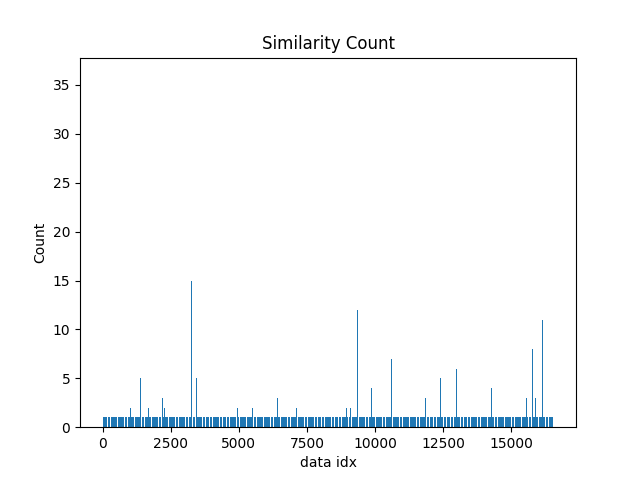

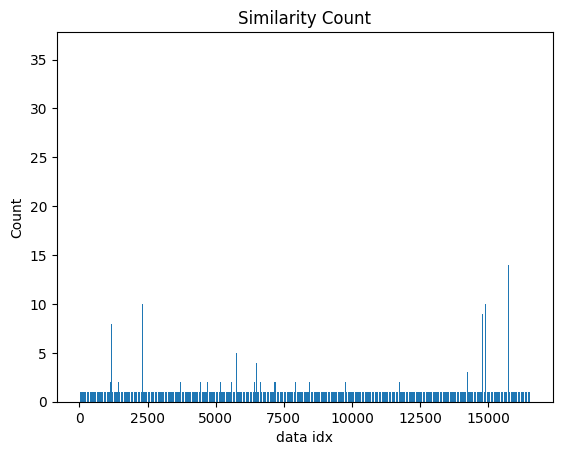

In [9]:
exp.plot_similarity_index(max_dist=0.2, top_k=0.01)

Now let's look at the output of the operation

In [10]:
import numpy as np

sim_idx = exp.similarity_index(max_dist=0.2, top_k=0.01, force=False)

Similarity matrix already exists. Reusing it. Pass force=True to overwrite it.


In [11]:
sim_idx

,idx,im_file,count,sim_im_files
0,0,/Users/ayushchaurasia/Documents/yoloexplorer/d...,1,[/Users/ayushchaurasia/Documents/yoloexplorer/...
1,1,/Users/ayushchaurasia/Documents/yoloexplorer/d...,3,[/Users/ayushchaurasia/Documents/yoloexplorer/...
2,2,/Users/ayushchaurasia/Documents/yoloexplorer/d...,1,[/Users/ayushchaurasia/Documents/yoloexplorer/...
3,3,/Users/ayushchaurasia/Documents/yoloexplorer/d...,2,[/Users/ayushchaurasia/Documents/yoloexplorer/...
4,4,/Users/ayushchaurasia/Documents/yoloexplorer/d...,1,[/Users/ayushchaurasia/Documents/yoloexplorer/...
...,...,...,...,...
16546,16546,/Users/ayushchaurasia/Documents/yoloexplorer/d...,1,[/Users/ayushchaurasia/Documents/yoloexplorer/...
16547,16547,/Users/ayushchaurasia/Documents/yoloexplorer/d...,1,[/Users/ayushchaurasia/Documents/yoloexplorer/...
16548,16548,/Users/ayushchaurasia/Documents/yoloexplorer/d...,1,[/Users/ayushchaurasia/Documents/yoloexplorer/...
16549,16549,/Users/ayushchaurasia/Documents/yoloexplorer/d...,1,[/Users/ayushchaurasia/Documents/yoloexplorer/...


Let's create a query to see what data points have similarity count of more than 30 and plot images similar to them.

In [12]:
import numpy as np

sim_count = np.array(sim_idx["count"])
sim_idx['im_file'][sim_count > 30]

7146     /Users/ayushchaurasia/Documents/yoloexplorer/d...
14035    /Users/ayushchaurasia/Documents/yoloexplorer/d...
Name: im_file, dtype: object

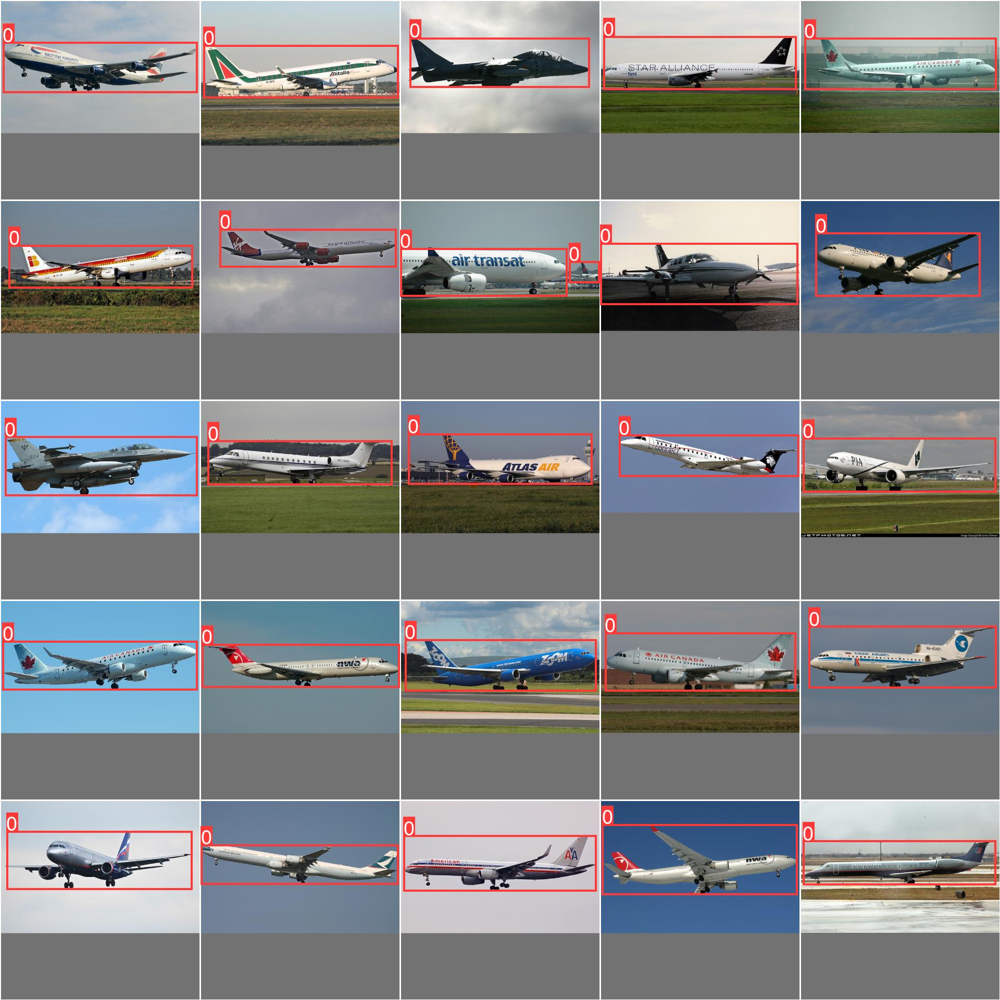

In [13]:
exp.plot_similar(idx=[7146, 14035]) # Using avg embeddings of 2 images